https://docs.opencv.org/4.x/d0/de3/tutorial_py_intro.html

In [1]:
#!pip install tensorflow

Active code page: 65001
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.7.1
    Uninstalling typing_extensions-4.7.1:
      Successfully uninstalled typing_extensions-4.7.1


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
arviz 0.11.2 requires typing-extensions<4,>=3.7.4.3, but you have typing-extensions 4.5.0 which is incompatible.
azure-core 1.29.3 requires typing-extensions>=4.6.0, but you have typing-extensions 4.5.0 which is incompatible.
pydantic 2.5.2 requires typing-extensions>=4.6.1, but you have typing-extensions 4.5.0 which is incompatible.
pydantic-core 2.14.5 requires typing-extensions!=4.7.0,>=4.6.0, but you have typing-extensions 4.5.0 which is incompatible.


In [2]:
#!pip install opencv-python

Active code page: 65001


# OpenCV : 이미지 다루기

In [1]:
from tensorflow.keras.datasets import mnist # keras 집중적으로 사용할 예정
import cv2
import matplotlib.pyplot as plt

In [4]:
cv2.__version__

'4.8.1'

In [2]:
mnist.load_data?
# (x_train, y_train) , (x_test, y_test)를 튜플로 묶어서 리턴

Signature: mnist.load_data(path='mnist.npz')
Docstring:
Loads the MNIST dataset.

This is a dataset of 60,000 28x28 grayscale images of the 10 digits,
along with a test set of 10,000 images.
More info can be found at the
[MNIST homepage](http://yann.lecun.com/exdb/mnist/).

Args:
  path: path where to cache the dataset locally
    (relative to `~/.keras/datasets`).

Returns:
  Tuple of NumPy arrays: `(x_train, y_train), (x_test, y_test)`.

**x_train**: uint8 NumPy array of grayscale image data with shapes
  `(60000, 28, 28)`, containing the training data. Pixel values range
  from 0 to 255.

**y_train**: uint8 NumPy array of digit labels (integers in range 0-9)
  with shape `(60000,)` for the training data.

**x_test**: uint8 NumPy array of grayscale image data with shapes
  (10000, 28, 28), containing the test data. Pixel values range
  from 0 to 255.

**y_test**: uint8 NumPy array of digit labels (integers in range 0-9)
  with shape `(10000,)` for the test data.

Example:

```python


In [6]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()

In [7]:
type(X_train), X_train.dtype, X_train.ndim, X_train.shape, X_train.size
# 배열 데이터, 3차원, 28*28*60000 = 47040000(스칼라 개수), 60000장의 이미지 데이터
# X : 설명데이터, Y : 정답데이터

(numpy.ndarray, dtype('uint8'), 3, (60000, 28, 28), 47040000)

In [8]:
X_train[0]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   3,
         18,  18,  18, 126, 136, 175,  26, 166, 255, 247, 127,   0,   0,
          0,   0],
       [  

In [9]:
y_train[0]

5

In [10]:
X_train[1]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,  51, 159, 253, 159,  50,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,  48, 238, 252, 252, 252, 237,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  

In [11]:
y_train[1]

0

In [12]:
# 자동 제한없이 행렬 전체 출력
# !!!! 컴퓨터 성능에 영향을 줄 수 있으므로 주의할 것 !!!!!!
# import sys
# import numpy as np
# np.set_printoptions(threshold=np.inf, linewidth=np.inf)

In [13]:
X_train[0]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   3,  18,  18,  18, 126, 136, 175,  26, 166, 255, 247, 127,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  30,  36,  94, 154, 170, 253, 253, 253, 253, 253, 225, 172

In [14]:
X_train[1]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  51, 159, 253, 159,  50,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  48, 238, 252, 252, 252, 237,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  54, 227, 253, 252, 239, 233, 252

## 이미지 읽고 출력
- pixabay 무료 이미지 소스 가져오기

In [43]:
import cv2
import matplotlib.pyplot as plt

In [47]:
# 이미지 읽어오기
img = cv2.imread("./data/car.jpg")

In [62]:
# 이미지 출력 (주피터 단독으로는 출력 불가 => plt 필수)
image = cv2.imread("./data/car.jpg", cv2.IMREAD_ANYCOLOR) # BGR로 인식하므로 컨버팅 필요
image[:3]

array([[[236, 238, 219],
        [236, 238, 219],
        [236, 238, 219],
        ...,
        [119, 125,  72],
        [103, 118,  61],
        [100, 119,  62]],

       [[237, 239, 220],
        [236, 238, 219],
        [236, 238, 219],
        ...,
        [125, 131,  76],
        [103, 118,  61],
        [ 86, 106,  47]],

       [[237, 239, 220],
        [237, 239, 220],
        [237, 239, 220],
        ...,
        [119, 125,  68],
        [103, 117,  59],
        [ 87, 105,  44]]], dtype=uint8)

In [63]:
type(image), image.dtype, image.ndim, image.shape, image.size

(numpy.ndarray, dtype('uint8'), 3, (826, 1280, 3), 3171840)

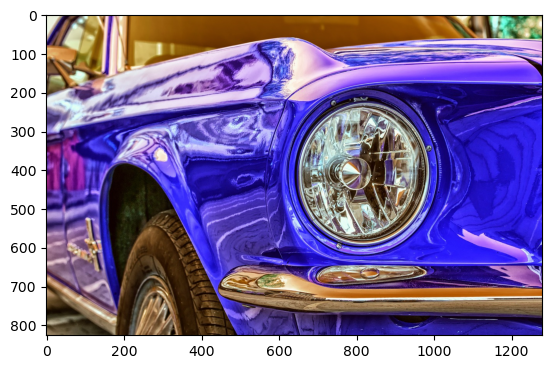

In [64]:
plt.imshow(image)

In [ ]:
# # 이미지 출력
# cv2.imshow('title', img) # 원본 출력
# cv2.waitKey(0)
# cv2.destroyAllWindows()

## 컨버팅
- 왜 OpenCV는 BGR을 쓸까?
- 일반적인 방법인 PIL로 이미지를 읽으면 RGB 순서로, OpenCV로 읽으면(cv2.imread 등) BGR순서로 이미지가 읽힌다.
- RGB, BGR 각각 Color space 또는 Color system을 말하며, 유추할 수 있듯 색상이 저장되는 순서가 서로 정반대이다.
- https://blog.xcoda.net/102
- https://learnopencv.com/why-does-opencv-use-bgr-color-format/

In [65]:
def imginfo(image):
    print(type(image), image.dtype, image.ndim, image.shape, image.size)

<class 'numpy.ndarray'> uint8 3 (826, 1280, 3) 3171840


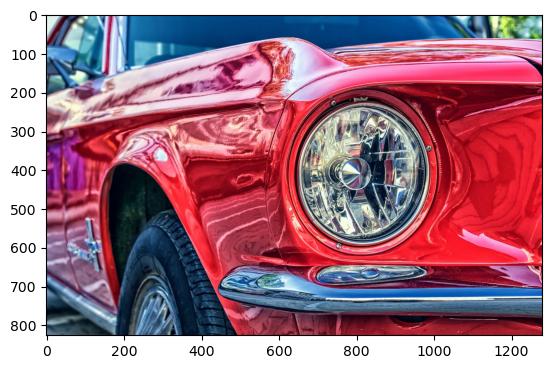

In [66]:
# bgr => rgb
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # RGB로 컨버팅
plt.imshow(image)
# plt.show()# 객체 디스크립션 숨김
imginfo(image)

<class 'numpy.ndarray'> uint8 2 (826, 1280) 1057280


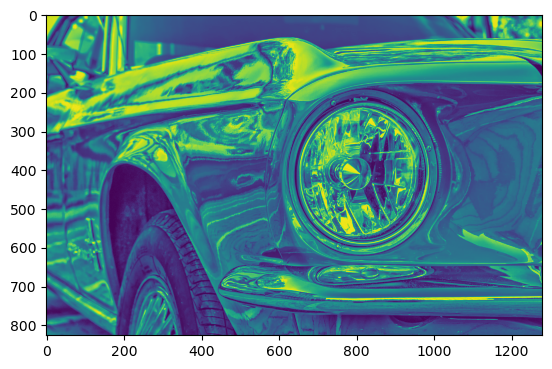

In [67]:
# bgr => gray
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray)
#plt.imshow(gray, cmap = 'gray')  # cmap = 'gray'
imginfo(gray)

In [68]:
gray[0], imginfo(gray[0])

<class 'numpy.ndarray'> uint8 1 (1280,) 1280


(array([232, 232, 232, ..., 108,  99, 100], dtype=uint8), None)

<class 'numpy.ndarray'> uint8 3 (826, 1280, 3) 3171840


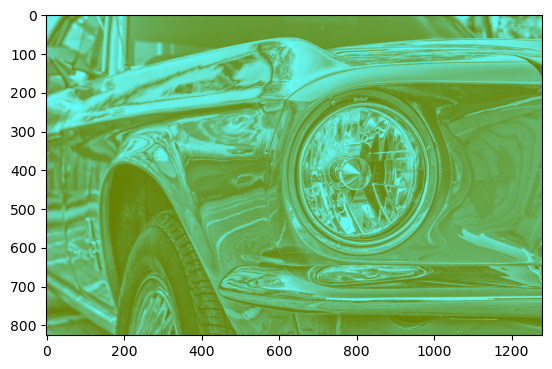

In [69]:
# gray => colormap
im_color = cv2.applyColorMap(gray, cv2.COLORMAP_SUMMER)
plt.imshow(im_color)
imginfo(im_color)

<class 'numpy.ndarray'> uint8 3 (826, 1280, 3) 3171840


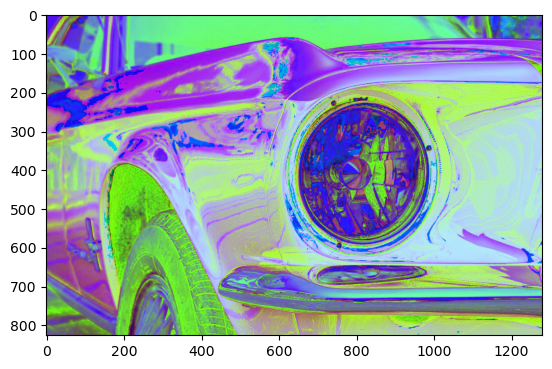

In [70]:
# 컨버팅 -> hsv 색 공간(명도, 채도 등등) 방식
# 컨버팅 -> 사실 여기에서는 RGB를 사용해야 초록색을 더 잘 찾아줄 것~

hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
plt.imshow(hsv)
imginfo(hsv)

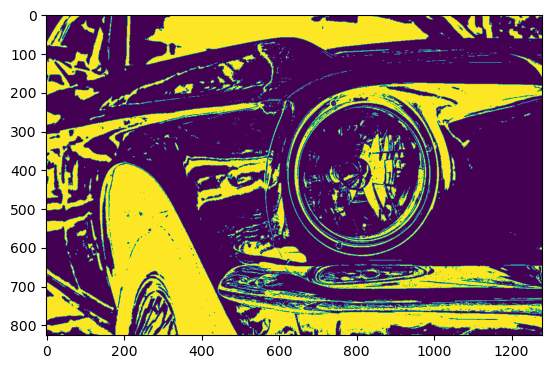

In [81]:
# 그린 색상 마스킹 (크로마키의 원리)
import numpy as np
lower_green = np.array([0, 100, 0])  # RGB값 [0, 100, 0]
upper_green = np.array([400, 700, 150])

mask_green = cv2.inRange(hsv, lower_green, upper_green) # 범위 설정할거야
plt.imshow(mask_green)

## 크기 조절
- 보간법 : 이미지의 크기를 변경하는 경우, 변형된 이미지의 픽셀은 추정해서 값을 할당해야 합니다.
이미지의 비율을 변경하면 존재하지 않는 영역에 새로운 픽셀값을 매핑하거나 존재하는 픽셀들을 압축해서 새로운 값을 할당해야 합니다.
- 이를 이미지 상에 존재하는 픽셀 데이터들에 대해 근사 함수를 적용해서 새로운 픽셀 값을 구하는 것으로 이해할 수 있습니다.
그러므로, 추정해야 하는 픽셀은 보간법을 이용하여 픽셀들의 값을 할당합니다.
    - 이미지를 축소하려면 일반적으로 #INTER_AREA 보간을 사용하는 것이 가장 좋습니다.
    - 이미지를 확대하면 일반적으로 #INTER_CUBIC(느림) 또는 #INTER_LINEAR를 사용하는 것이 가장 좋습니다.

In [82]:
height, width, channel = image.shape
height, width, channel

(826, 1280, 3)

In [83]:
cv2.resize?

Docstring:
resize(src, dsize[, dst[, fx[, fy[, interpolation]]]]) -> dst
.   @brief Resizes an image.
.   
.   The function resize resizes the image src down to or up to the specified size. Note that the
.   initial dst type or size are not taken into account. Instead, the size and type are derived from
.   the `src`,`dsize`,`fx`, and `fy`. If you want to resize src so that it fits the pre-created dst,
.   you may call the function as follows:
.   @code
.       // explicitly specify dsize=dst.size(); fx and fy will be computed from that.
.       resize(src, dst, dst.size(), 0, 0, interpolation);
.   @endcode
.   If you want to decimate the image by factor of 2 in each direction, you can call the function this
.   way:
.   @code
.       // specify fx and fy and let the function compute the destination image size.
.       resize(src, dst, Size(), 0.5, 0.5, interpolation);
.   @endcode
.   To shrink an image, it will generally look best with #INTER_AREA interpolation, whereas to
.   enlar

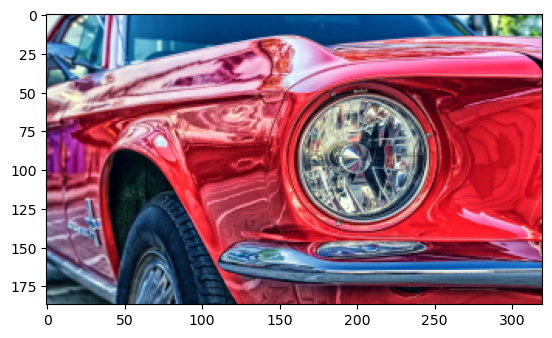

In [86]:
# 크기 조절 (축소) resize
dst = cv2.resize(image, dsize=(320,187), interpolation=cv2.INTER_AREA) 
#interpolation 보간

plt.imshow(dst)

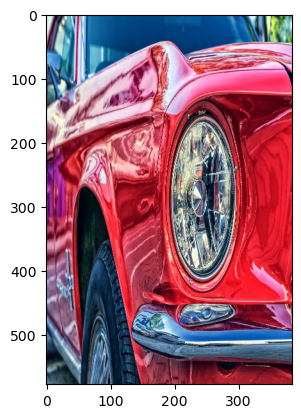

In [87]:
# 크기 조절 : resize, interpolation 메서드 활용 ver.
dst = cv2.resize(image, dsize=(0,0), fx=0.3, fy=0.7, interpolation=cv2.INTER_LINEAR) 
# X축기준으로 30%, Y축 기준으로 70% 크기 조절, dzie(0,0)하면 비율 적용
plt.imshow(dst)

<class 'numpy.ndarray'> uint8 3 (1652, 2560, 3) 12687360


<function matplotlib.pyplot.show(close=None, block=None)>

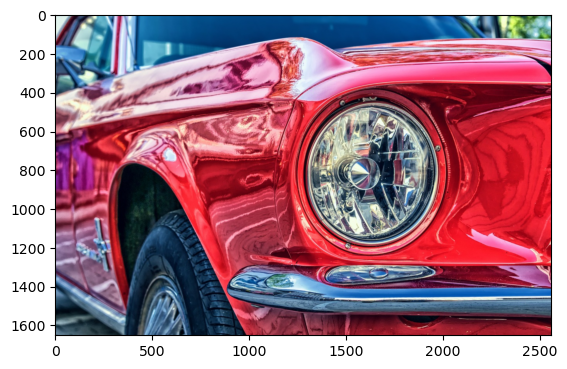

In [91]:
# 확대 : pyrUp 메서드 활용 ver.
dst3 = cv2.pyrUp(image, dstsize=(width*2, height*2))
plt.imshow(dst3)
imginfo(dst3)
plt.show

In [ ]:
cv2.pyrDown?

<class 'numpy.ndarray'> uint8 3 (413, 640, 3) 792960


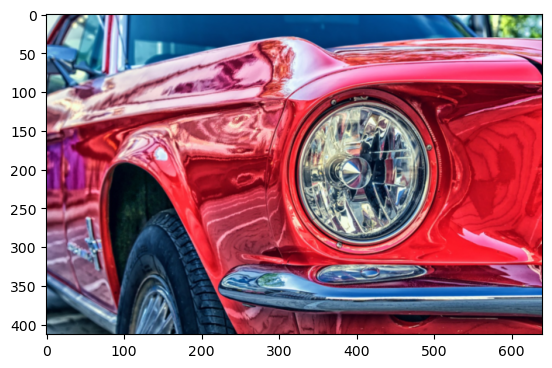

In [92]:
# 이미지 축소 메서드 : 품질을 유지하는 선에서 축소
dst4 = cv2.pyrDown(image)
plt.imshow(dst4)
imginfo(dst4)
plt.show()

## 자르기

In [94]:
imginfo(image) # 원본 이미지 사이즈 확인  

<class 'numpy.ndarray'> uint8 3 (826, 1280, 3) 3171840


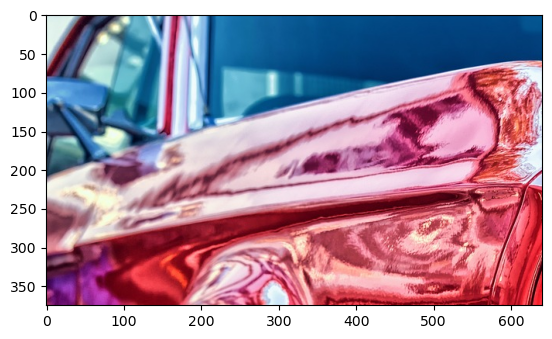

In [95]:
dst5 = image[:375, :641]
plt.imshow(dst5)

- X 위치(디스플레이를 위한 영역)의 기준은 좌상단 : 여기에서 + 는 위치를 아래로 옮긴다는 뜻
- (+) 될수록 좌상단으로부터 멀어지는 거니까

In [ ]:
# 가운데 중심점을 기준으로 50% 이미지 잘라내기
# 가운데 중심점 : height/2, width/2 , 시작위치 : height/2 – height/4    ,  끝위치: height/2 + height/4를 계산
#  image[y범위, x범위]

dst6 = image[int(height/2-height/4) : int(height/2+height/4),    # y 범위 = 구간
              # int(height/2-height/4) = 결국 1/4 이라는 뜻
              # int(height/2+height/4) = 결국 3/4 이라는 뜻
             int(width/2-width/4)  : int(width/2+width/4)] # x범위
plt.imshow(dst6)

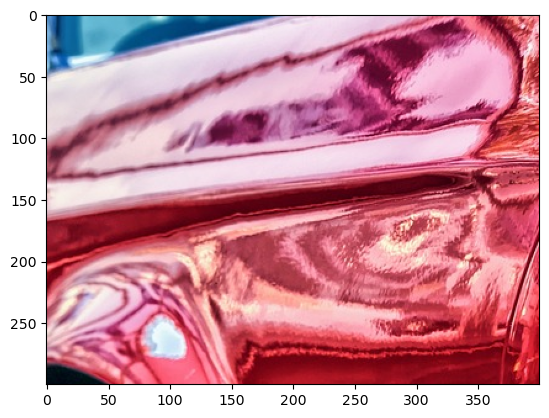

In [96]:
import tensorflow as tf
# IMAGE CROP : 바운딩 박스 함수
dst14 = tf.image.crop_to_bounding_box(image, 100, 200, 300, 400) # BOX좌표 
# offset : 새로운 기준점을 의미
# offset_height(위에서 아래로 +100), offset_width(좌에서 우방향으로 +200), target_height(offset지점에서부터 높이+300), target_width(offset지점부터 +400)
plt.imshow(dst14)

## 이동

In [97]:
rows, cols, channels = image.shape
image.shape

(826, 1280, 3)

In [98]:
cv2.warpAffine?

Docstring:
warpAffine(src, M, dsize[, dst[, flags[, borderMode[, borderValue]]]]) -> dst
.   @brief Applies an affine transformation to an image.
.   
.   The function warpAffine transforms the source image using the specified matrix:
.   
.   \f[\texttt{dst} (x,y) =  \texttt{src} ( \texttt{M} _{11} x +  \texttt{M} _{12} y +  \texttt{M} _{13}, \texttt{M} _{21} x +  \texttt{M} _{22} y +  \texttt{M} _{23})\f]
.   
.   when the flag #WARP_INVERSE_MAP is set. Otherwise, the transformation is first inverted
.   with #invertAffineTransform and then put in the formula above instead of M. The function cannot
.   operate in-place.
.   
.   @param src input image.
.   @param dst output image that has the size dsize and the same type as src .
.   @param M \f$2\times 3\f$ transformation matrix.
.   @param dsize size of the output image.
.   @param flags combination of interpolation methods (see #InterpolationFlags) and the optional
.   flag #WARP_INVERSE_MAP that means that M is the inverse transf

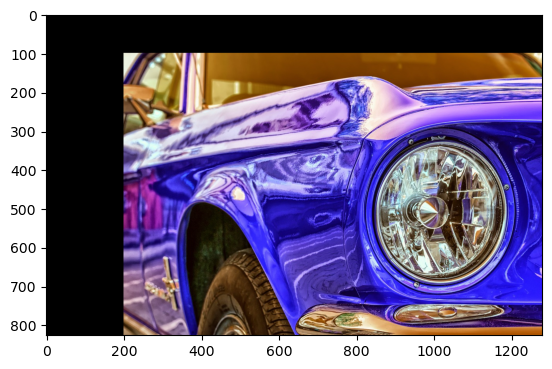

In [99]:
rows, cols, channels = img.shape

m = np.float32([[1,0,200],[0,1,100]]) # '이동할 값'을 자동으로 지정해주자
# '이동할 값' 해석 = [x축 True, y축 false, 이동 200 ], [x축 false, y축 True, 이동 100]

dst = cv2.warpAffine(img, m, (cols,rows)) # m = move

plt.imshow(dst)  # 200 x 100 만큼 이동했네!

## 회전

In [100]:
cv2.getRotationMatrix2D?
# getRotationMatrix2D(center, angle, scale)  회전의 기준이 어디야? center

Docstring:
getRotationMatrix2D(center, angle, scale) -> retval
.   @brief Calculates an affine matrix of 2D rotation.
.   
.   The function calculates the following matrix:
.   
.   \f[\begin{bmatrix} \alpha &  \beta & (1- \alpha )  \cdot \texttt{center.x} -  \beta \cdot \texttt{center.y} \\ - \beta &  \alpha &  \beta \cdot \texttt{center.x} + (1- \alpha )  \cdot \texttt{center.y} \end{bmatrix}\f]
.   
.   where
.   
.   \f[\begin{array}{l} \alpha =  \texttt{scale} \cdot \cos \texttt{angle} , \\ \beta =  \texttt{scale} \cdot \sin \texttt{angle} \end{array}\f]
.   
.   The transformation maps the rotation center to itself. If this is not the target, adjust the shift.
.   
.   @param center Center of the rotation in the source image.
.   @param angle Rotation angle in degrees. Positive values mean counter-clockwise rotation (the
.   coordinate origin is assumed to be the top-left corner).
.   @param scale Isotropic scale factor.
.   
.   @sa  getAffineTransform, warpAffine, transform
Typ

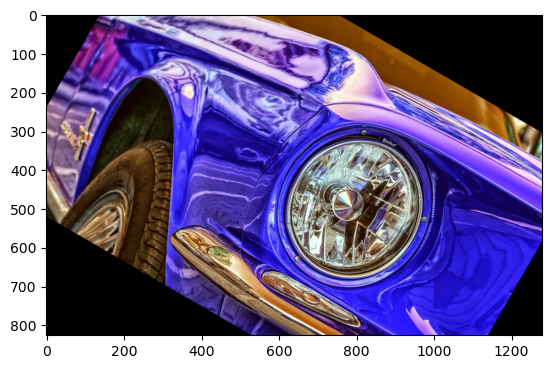

In [103]:
# 중심점에서 30도 시계방향 (마이너스 없으면 반시계방향~)
M = cv2.getRotationMatrix2D((cols/2, rows/2), -30, 1) 

rotate_30 = cv2.warpAffine(img, M, (cols,rows))

plt.imshow(rotate_30)

## 흐리게, 선명하게
- 이미지 또는 영상을 흐릿하게 만드는 원리는, kernel를 전체 이미지에 convolution을 돌림으로써, 커널 사이즈에 맞게 픽셀 평균값을 대입하는 것입니다.
- 즉, 특정 픽셀의 주변 값의 평균(또는 임의의 array 연산)값을 해당 픽셀에 넣는 것입니다.
- 2D Convolution kernel(또는 Convolution filter)의 원리는 딥러닝에서도 CNN이라는 유명 알고리즘에 사용되는 동일한 방식입니다.

- 원본 소스를 Convolution kernel(또는 Convolution filter)에 투영시켜 새로운 값을 얻는다

In [105]:
cv2.blur?

Docstring:
blur(src, ksize[, dst[, anchor[, borderType]]]) -> dst
.   @brief Blurs an image using the normalized box filter.
.   
.   The function smooths an image using the kernel:
.   
.   \f[\texttt{K} =  \frac{1}{\texttt{ksize.width*ksize.height}} \begin{bmatrix} 1 & 1 & 1 &  \cdots & 1 & 1  \\ 1 & 1 & 1 &  \cdots & 1 & 1  \\ \hdotsfor{6} \\ 1 & 1 & 1 &  \cdots & 1 & 1  \\ \end{bmatrix}\f]
.   
.   The call `blur(src, dst, ksize, anchor, borderType)` is equivalent to `boxFilter(src, dst, src.type(), ksize,
.   anchor, true, borderType)`.
.   
.   @param src input image; it can have any number of channels, which are processed independently, but
.   the depth should be CV_8U, CV_16U, CV_16S, CV_32F or CV_64F.
.   @param dst output image of the same size and type as src.
.   @param ksize blurring kernel size.
.   @param anchor anchor point; default value Point(-1,-1) means that the anchor is at the kernel
.   center.
.   @param borderType border mode used to extrapolate pixels outside

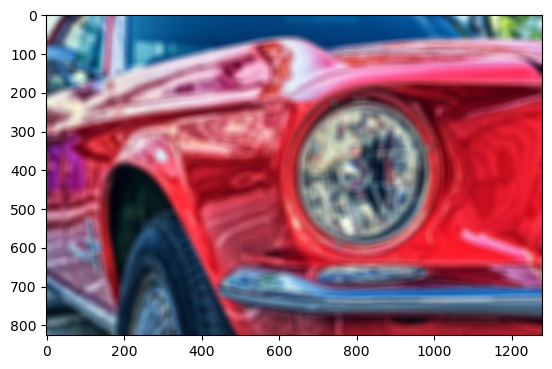

In [106]:
dst7 = cv2.blur(image, (20, 20)) # 값이 커질수록 더 흐려짐 , 필터의 컨벌루션
plt.imshow(dst7)

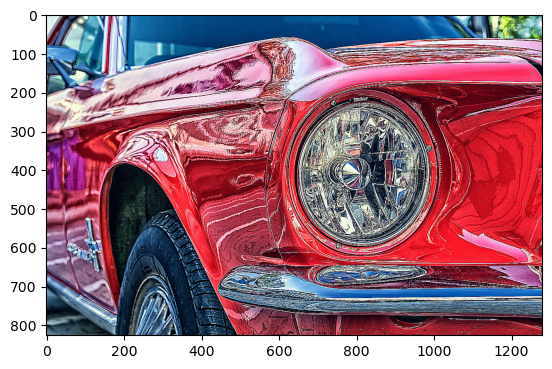

In [107]:
# 중앙값을 키워주는 형태의 마스크를 만든 후 적용하여 특징을 강조(sharpening)
# sharpening ; 주변 pixel과의 차이를 극대화시켜 경계부분의 명암비를 증가시키는 작업
# 주변부의 픽셀값을 감소시킬때, 강조될 강도를 mask중앙에 지정하고
# 주변부의 값을 줄여 총합이 1이 되도록 mask 생성

kernel = np.array([ [-1, -1, -1], [-1, 9, -1], [-1, -1, -1]    ]) # 필터 ,
dst8 = cv2.filter2D(image, -1, kernel) 
#두번째 인자인 depth은 출력영상의 데이터타입으로 default는 -1로 입력과 동일한 타입으로 출력

plt.imshow(dst8)

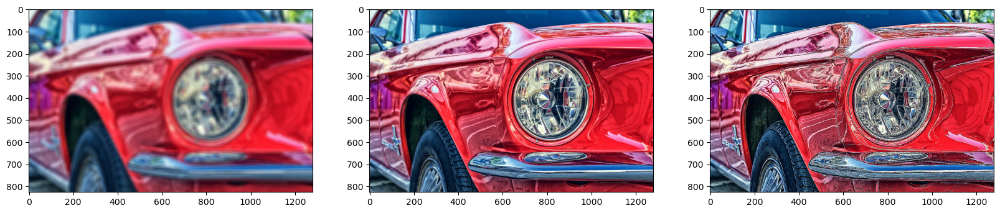

In [108]:
fig, ax = plt.subplots(1, 3, figsize = (20, 10))
ax[0].imshow(dst7)  # 흐리게
ax[1].imshow(image) # 원본
ax[2].imshow(dst8)  # 선명하게(샤프닝)

## 대칭

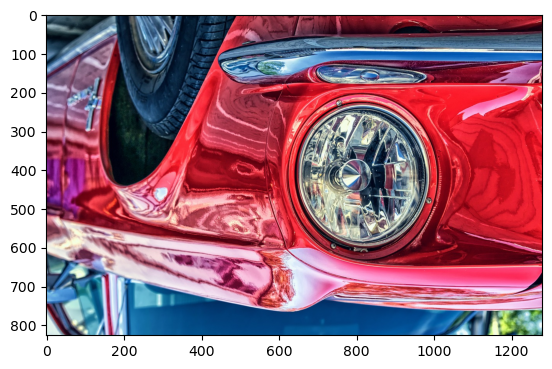

In [109]:
# 상하 대칭
dst9 = cv2.flip(image, 0)
plt.imshow(dst9)

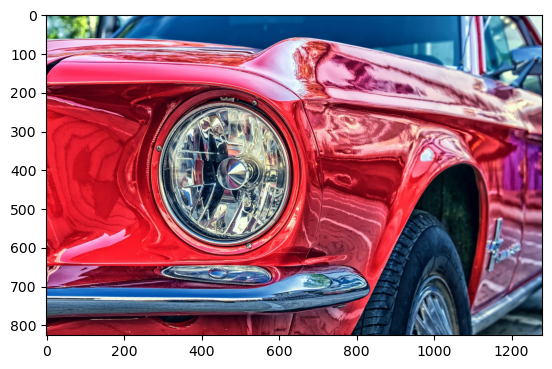

In [110]:
# 좌우 대칭
dst10 = cv2.flip(image, 1)
plt.imshow(dst10)

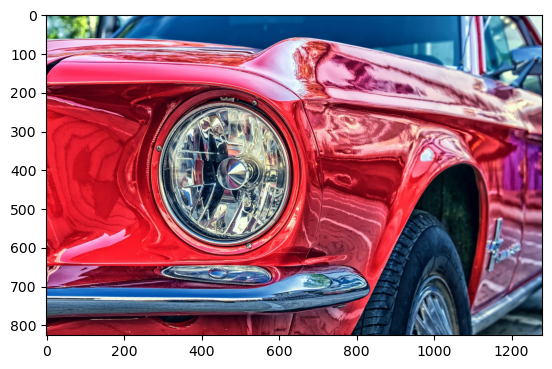

In [111]:
import tensorflow as tf
dst15 = tf.image.flip_left_right(image)
plt.imshow(dst15)

## 경계 추출, 엣지
- canny 알고리즘을 이용해서 경계를 추출합니다.
- = 갑자기 값이 크게 변동했다 --> 이 부분에 경계가 있다고 추측
- https://engineer-mole.tistory.com/243

In [112]:
cv2.Canny?

Docstring:
Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]]) -> edges
.   @brief Finds edges in an image using the Canny algorithm @cite Canny86 .
.   
.   The function finds edges in the input image and marks them in the output map edges using the
.   Canny algorithm. The smallest value between threshold1 and threshold2 is used for edge linking. The
.   largest value is used to find initial segments of strong edges. See
.   <http://en.wikipedia.org/wiki/Canny_edge_detector>
.   
.   @param image 8-bit input image.
.   @param edges output edge map; single channels 8-bit image, which has the same size as image .
.   @param threshold1 first threshold for the hysteresis procedure.
.   @param threshold2 second threshold for the hysteresis procedure.
.   @param apertureSize aperture size for the Sobel operator.
.   @param L2gradient a flag, indicating whether a more accurate \f$L_2\f$ norm
.   \f$=\sqrt{(dI/dx)^2 + (dI/dy)^2}\f$ should be used to calculate the imag

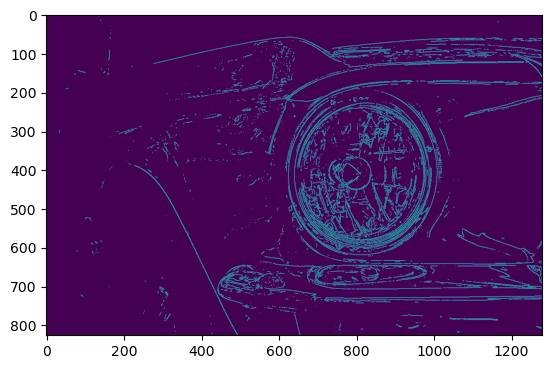

In [115]:
dst11 = cv2.Canny(image, 500, 500) 
# 앞의 숫자 : minVal -> 이 수치가 작을수록 인근 엣지와 더 잘 연결됨
# 뒤의 숫자 : maxvVal -> 이 수치가 작을수록 엣지를 많이 추출함
plt.imshow(dst11)

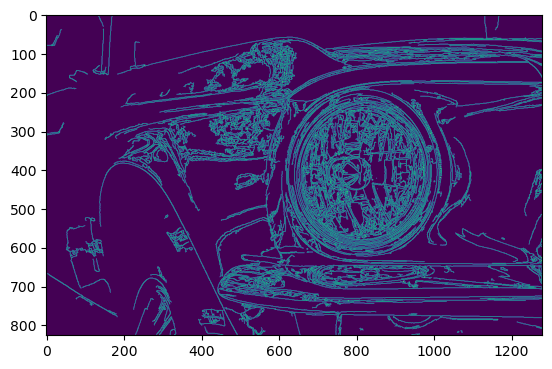

In [116]:
dst11 = cv2.Canny(image, 50, 500)
plt.imshow(dst11)

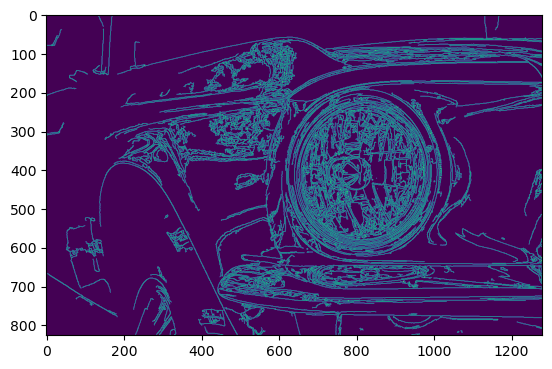

In [117]:
dst11 = cv2.Canny(image, 500, 50) 
# src, 작아질수록 엣지가 연결이 더 잘됨 , 작아질수록 엣지추출이 많아짐
plt.imshow(dst11)

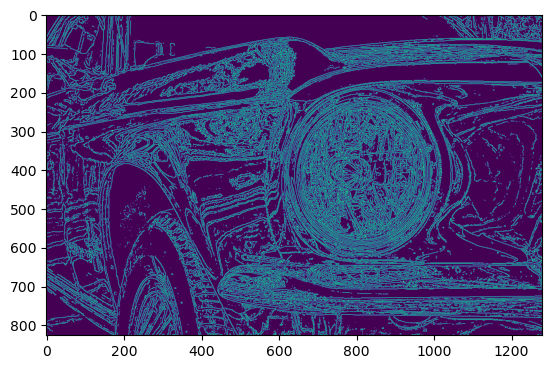

In [118]:
dst11 = cv2.Canny(image, 100, 100)
plt.imshow(dst11)

## 이미지 저장

In [120]:
# 미변환하면 색상값이 BGR로 변경되므로 컨버팅 필요
# 변환전
cv2.imwrite('car_resize1.jpg', dst7)

True

In [121]:
# 변환 후
dst7_BGR = cv2.cvtColor(dst7, cv2.COLOR_BGR2RGB)
cv2.imwrite('car_resize2.jpg', dst7_BGR)

True

In [122]:
# 원본 이미지를 팝업창으로 띄울 수도 있다(chat GPT)

import cv2

# 이미지 경로 확인
image_path = "./data/car.jpg"

# 이미지 읽기
img = cv2.imread(image_path)

if img is not None:
    # 이미지가 정상적으로 읽혔을 때의 처리
    cv2.imshow("Image", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
else:
    print("이미지를 읽을 수 없습니다. 경로를 확인해주세요.")

### < 연습 문제 > --> '이미지 데이터 증강'을 위한 실습
- 다양한 처리기법을 포함한 랜덤 이미지 변환 함수를 만들어보세요.- 
image폴더 안에 있는 모든 이미지에 랜덤변환함수를 적용하여 result 폴더에 저장하세요

In [123]:
import os
print(os.getcwd())
print(os.listdir())

C:\Users\Jiyoung\Documents\workspace\wassup\python
['.ipynb_checkpoints', '04_OpenCV_이미지.html', '231226_OpenCV.ipynb', 'car_resize1.jpg', 'car_resize2.jpg', 'data', 'image', 'sample', '데이터분석_교안', '실습_교안', '실습_필기', '연습문제', '연습장.ipynb']


In [134]:
img_folder_list = os.listdir('./image')
img_folder_list

['1_0.jpg',
 '1_1.jpg',
 '1_10.jpg',
 '1_11.jpg',
 '1_12.jpg',
 '1_13.jpg',
 '1_14.jpg',
 '1_15.jpg',
 '1_16.jpg',
 '1_17.jpg',
 '1_18.jpg',
 '1_19.jpg',
 '1_2.jpg',
 '1_20.jpg',
 '1_21.jpg',
 '1_3.jpg',
 '1_4.jpg',
 '1_5.jpg',
 '1_6.jpg',
 '1_7.jpg',
 '1_8.jpg',
 '1_9.jpg',
 '2_0.jpg',
 '2_1.jpg',
 '2_10.jpg',
 '2_11.jpg',
 '2_12.jpg',
 '2_13.jpg',
 '2_14.jpg',
 '2_15.jpg',
 '2_16.jpg',
 '2_17.jpg',
 '2_18.jpg',
 '2_19.jpg',
 '2_2.jpg',
 '2_20.jpg',
 '2_21.jpg',
 '2_22.jpg',
 '2_23.jpg',
 '2_24.jpg',
 '2_25.jpg',
 '2_3.jpg',
 '2_4.jpg',
 '2_5.jpg',
 '2_6.jpg',
 '2_7.jpg',
 '2_8.jpg',
 '2_9.jpg']

In [126]:
import glob # 경로 가져오는 모듈
img_path = glob.glob('./image/*.jpg') # 이미지폴더 내 모든 이미지파일 경로
img_path

['./image\\1_0.jpg',
 './image\\1_1.jpg',
 './image\\1_10.jpg',
 './image\\1_11.jpg',
 './image\\1_12.jpg',
 './image\\1_13.jpg',
 './image\\1_14.jpg',
 './image\\1_15.jpg',
 './image\\1_16.jpg',
 './image\\1_17.jpg',
 './image\\1_18.jpg',
 './image\\1_19.jpg',
 './image\\1_2.jpg',
 './image\\1_20.jpg',
 './image\\1_21.jpg',
 './image\\1_3.jpg',
 './image\\1_4.jpg',
 './image\\1_5.jpg',
 './image\\1_6.jpg',
 './image\\1_7.jpg',
 './image\\1_8.jpg',
 './image\\1_9.jpg',
 './image\\2_0.jpg',
 './image\\2_1.jpg',
 './image\\2_10.jpg',
 './image\\2_11.jpg',
 './image\\2_12.jpg',
 './image\\2_13.jpg',
 './image\\2_14.jpg',
 './image\\2_15.jpg',
 './image\\2_16.jpg',
 './image\\2_17.jpg',
 './image\\2_18.jpg',
 './image\\2_19.jpg',
 './image\\2_2.jpg',
 './image\\2_20.jpg',
 './image\\2_21.jpg',
 './image\\2_22.jpg',
 './image\\2_23.jpg',
 './image\\2_24.jpg',
 './image\\2_25.jpg',
 './image\\2_3.jpg',
 './image\\2_4.jpg',
 './image\\2_5.jpg',
 './image\\2_6.jpg',
 './image\\2_7.jpg',
 './im

In [127]:
import random
def rd_change(img):   # 랜덤 이미지를 리턴하는 함수 만들기 
    rows, cols, channels = img.shape
    rotate = random.randint(0,360)      # 360도까지 랜덤하게 회전~
    x_shift = random.randint(-100,100)  # -100 ~ 100 사이에서 랜덤하게
    y_shift = random.randint(-100,100)  # -100 ~ 100 사이에서 랜덤하게

    # move
    sm = np.float32([[1,0,x_shift],[0,1,y_shift]])
    img = cv2.warpAffine(img,sm,(cols,rows))

    # rotate
    rm = cv2.getRotationMatrix2D((cols/2,rows/2),rotate,1)
    img = cv2.warpAffine(img,rm,(cols,rows))
    
    return img

In [128]:
# 파일명 잘라오기
def file_name(path):
    name = path.split('\\')[1]
    return name

In [129]:
# 실행 및 이미지 저장
import cv2
import numpy as np
os.mkdir('result')  # 변환 이미지를 저장하기 위한 용도로 'result' 폴더를 생성하라

num = 0
for path in img_path:
    img = cv2.imread(path)
    rd_changed = rd_change(img)
    
    name = file_name(path)
    cv2.imwrite('./result/'+name, rd_changed) # result 폴더에 '~'한 형식으로 파일명 저장하라
    num += 1
    print(num, path, '변환 저장 완료')
print('전체 이미지 변환 저장이 완료됐습니다.')

1 ./image\1_0.jpg 변환 저장 완료
2 ./image\1_1.jpg 변환 저장 완료
3 ./image\1_10.jpg 변환 저장 완료
4 ./image\1_11.jpg 변환 저장 완료
5 ./image\1_12.jpg 변환 저장 완료
6 ./image\1_13.jpg 변환 저장 완료
7 ./image\1_14.jpg 변환 저장 완료
8 ./image\1_15.jpg 변환 저장 완료
9 ./image\1_16.jpg 변환 저장 완료
10 ./image\1_17.jpg 변환 저장 완료
11 ./image\1_18.jpg 변환 저장 완료
12 ./image\1_19.jpg 변환 저장 완료
13 ./image\1_2.jpg 변환 저장 완료
14 ./image\1_20.jpg 변환 저장 완료
15 ./image\1_21.jpg 변환 저장 완료
16 ./image\1_3.jpg 변환 저장 완료
17 ./image\1_4.jpg 변환 저장 완료
18 ./image\1_5.jpg 변환 저장 완료
19 ./image\1_6.jpg 변환 저장 완료
20 ./image\1_7.jpg 변환 저장 완료
21 ./image\1_8.jpg 변환 저장 완료
22 ./image\1_9.jpg 변환 저장 완료
23 ./image\2_0.jpg 변환 저장 완료
24 ./image\2_1.jpg 변환 저장 완료
25 ./image\2_10.jpg 변환 저장 완료
26 ./image\2_11.jpg 변환 저장 완료
27 ./image\2_12.jpg 변환 저장 완료
28 ./image\2_13.jpg 변환 저장 완료
29 ./image\2_14.jpg 변환 저장 완료
30 ./image\2_15.jpg 변환 저장 완료
31 ./image\2_16.jpg 변환 저장 완료
32 ./image\2_17.jpg 변환 저장 완료
33 ./image\2_18.jpg 변환 저장 완료
34 ./image\2_19.jpg 변환 저장 완료
35 ./image\2_2.jpg 변환 저장 완료
36 ./im